In [5]:
import ddsp
print(ddsp.__version__)


3.6.0


In [ ]:
#base on https://github.com/magenta/ddsp/blob/main/ddsp/colab/demos/train_autoencoder.ipynb

In [ ]:
#!pip install sounddevice

In [6]:
import os
from ddsp.colab import colab_utils_perso
#AUDIO_DIR = 'C:/Users/Jesús Pavón García/Desktop/TFG/DDSP_tfg/DataSet/Bagpipes/samples/Jack Lee Bagpipe Music Library' #'data/audio' 
AUDIO_DIR = 'C:/Users/Jesús Pavón García/Desktop/TFG/DDSP_tfg/DataSet/Bagpipes/train' 
AUDIO_FILEPATTERN = AUDIO_DIR + '/*'
SAVE_DIR = 'C:/Users/Jesús Pavón García/Desktop/TFG/DDSP_tfg/content/models/ddsp-solo-instrument'
os.makedirs(AUDIO_DIR, exist_ok=True)
os.makedirs(SAVE_DIR, exist_ok=True)

C:\Users\Jesús Pavón García\AppData\Local\Programs\Python\Python310\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [10]:
"""
import glob
import shutil 

#busca los .mp3 y .wav
mp3_files = glob.glob(os.path.join(AUDIO_DIR, '*.mp3'))
wav_files = glob.glob(os.path.join(AUDIO_DIR, '*.wav'))
audio = mp3_files + wav_files

audio_files, _ = upload(audio)
for fname in audio_files:
    target_name = os.path.join(AUDIO_DIR, os.path.basename(fname).replace(' ', '_'))
    print(f'Copying {fname} to {target_name}')
    shutil.copy(fname, target_name)"""
"""    

"\naudio_files, _ = upload(AUDIO_DIR)\nfor fname in audio_files:\n    target_name = os.path.join(AUDIO_DIR, os.path.basename(fname).replace(' ', '_'))\n    print(f'Copying {fname} to {target_name}')\n    shutil.copy(fname, target_name)\n"

In [5]:
import glob
import os
import subprocess

# Rutas locales
TRAIN_TFRECORD = r'C:/Users/Jesús Pavón García/Desktop/TFG/DDSP_tfg/content/models/ddsp-solo-instrument/TFRECORD/train.tfrecord'
TRAIN_TFRECORD_FILEPATTERN = TRAIN_TFRECORD + '*'

# Verifica si hay archivos de audio
if not glob.glob(AUDIO_FILEPATTERN):
    raise ValueError('No se encontraron archivos de audio en ' + AUDIO_FILEPATTERN)

# Asegúrate de que la carpeta de salida existe
output_dir = os.path.dirname(TRAIN_TFRECORD)
os.makedirs(output_dir, exist_ok=True)


# Ejecuta el comando para preparar el tfrecord
cmd = [
    "ddsp_prepare_tfrecord",
    f"--input_audio_filepatterns={AUDIO_FILEPATTERN}",
    f"--output_tfrecord_path={TRAIN_TFRECORD}",
    "--num_shards=10",
    "--alsologtostderr"
]

print("Ejecutando ddsp_prepare_tfrecord...")
subprocess.run(cmd, shell=True)


Ejecutando ddsp_prepare_tfrecord...


CompletedProcess(args=['ddsp_prepare_tfrecord', '--input_audio_filepatterns=C:/Users/Jesús Pavón García/Desktop/TFG/DDSP_tfg/DataSet/Bagpipes/train/*', '--output_tfrecord_path=C:/Users/Jesús Pavón García/Desktop/TFG/DDSP_tfg/content/models/ddsp-solo-instrument/TFRECORD/train.tfrecord', '--num_shards=10', '--alsologtostderr'], returncode=0)

In [ ]:
"""
We need to do some preprocessing on the raw audio you uploaded to get it into the correct format for training. 
This involves turning the full audio into short (4-second) examples, 
inferring the fundamental frequency (or "pitch") with CREPE, and computing the loudness. 
These features will then be stored in a sharded TFRecord file for easier loading.
Depending on the amount of input audio, this process usually takes a few minutes.

IMPORTANT EXPERIMENT - FERHO COM DIUEN ELLS I DESPRES FERHO AMB EL MEU
"""

In [9]:
import os
import ddsp.training
from ddsp.colab import colab_utils_perso

In [10]:
# Rutas locales
TRAIN_TFRECORD = 'C:/Users/Jesús Pavón García/Desktop/TFG/DDSP_tfg/content/models/ddsp-solo-instrument/TFRECORD/train.tfrecord'
TRAIN_TFRECORD_FILEPATTERN = TRAIN_TFRECORD + '*'

data_provider = ddsp.training.data.TFRecordProvider(TRAIN_TFRECORD_FILEPATTERN)
dataset = data_provider.get_dataset(shuffle=False)
PICKLE_FILE_PATH = os.path.join(SAVE_DIR, 'dataset_statistics.pkl')
_ = colab_utils_perso.save_dataset_statistics(data_provider, PICKLE_FILE_PATH)

Calculating dataset statistics for <ddsp.training.data.TFRecordProvider object at 0x0000017206168700>
Computing statistics for 1496 examples.
Done! Saved dataset statistics to: C:/Users/Jesús Pavón García/Desktop/TFG/DDSP_tfg/content/models/ddsp-solo-instrument\dataset_statistics.pkl


In [11]:
import tensorflow as tf

tfrecord_path = 'C:/Users/Jesús Pavón García/Desktop/TFG/DDSP_tfg/content/models/ddsp-solo-instrument/TFRECORD/train.tfrecord-00001-of-00010'
raw_dataset = tf.data.TFRecordDataset(tfrecord_path)

for raw_record in raw_dataset.take(1):
    example = tf.train.Example()
    example.ParseFromString(raw_record.numpy())

    print("Características disponibles:")
    for key in example.features.feature:
        feature = example.features.feature[key]
        kind = feature.WhichOneof('kind')
        length = len(getattr(feature, kind).value)
        print(f"  - {key} ({kind}), longitud: {length}")



Características disponibles:
  - audio_16k (float_list), longitud: 64000
  - f0_hz (float_list), longitud: 1000
  - f0_confidence (float_list), longitud: 1000
  - loudness_db (float_list), longitud: 1000
  - audio (float_list), longitud: 64000


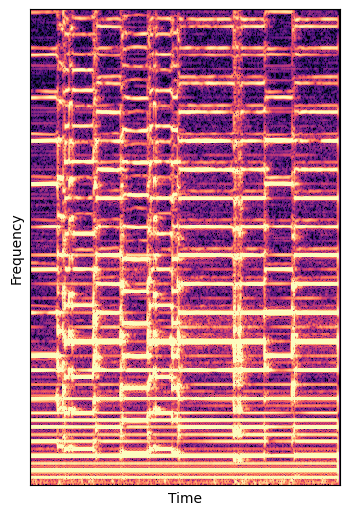

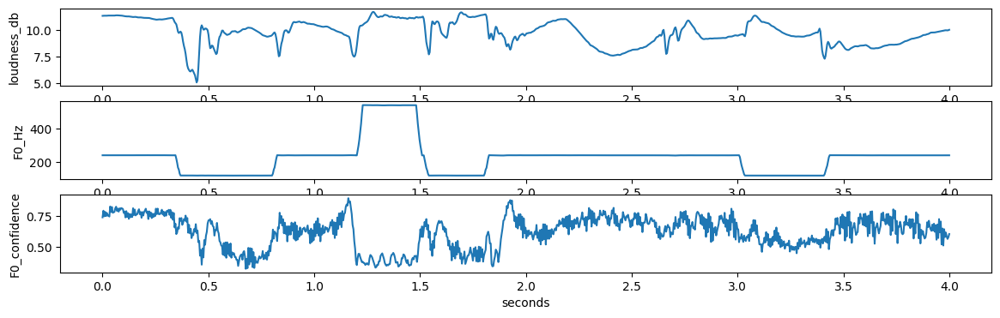

In [4]:
from ddsp.colab import colab_utils_perso
import ddsp.training
from matplotlib import pyplot as plt
import numpy as np

data_provider = ddsp.training.data.TFRecordProvider(TRAIN_TFRECORD_FILEPATTERN)
dataset = data_provider.get_dataset(shuffle=False)

try:
  ex = next(iter(dataset))
except StopIteration:
  raise ValueError(
      'TFRecord contains no examples. Please try re-running the pipeline with '
      'different audio file(s).')

colab_utils_perso.specplot(ex['audio'])
colab_utils_perso.play(ex['audio'])

f, ax = plt.subplots(3, 1, figsize=(14, 4))
x = np.linspace(0, 4.0, 1000)
ax[0].set_ylabel('loudness_db')
ax[0].plot(x, ex['loudness_db'])
ax[1].set_ylabel('F0_Hz')
ax[1].set_xlabel('seconds')
ax[1].plot(x, ex['f0_hz'])
ax[2].set_ylabel('F0_confidence')
ax[2].set_xlabel('seconds')
ax[2].plot(x, ex['f0_confidence'])

In [69]:
"""We will now train a "solo instrument" model. This means the model 
is conditioned only on the fundamental frequency (f0) 
and loudness with no instrument ID or latent timbre feature. If you uploaded audio of multiple instruemnts,
the neural network you train will attempt to model all timbres, 
but will likely associate certain timbres with different f0 and loudness conditions.
"""
"""
#MODELS copy/paste
#A ddsp-solo-instrument-34 files-3k-steps - 10 min - 1 source - no equilibrat/TRAIN_CHECK 
#B ddsp-solo-instrument -438files-3ksteps - 30 min - 5 source - equilibrat/TRAIN_CHECK
#C ddsp-solo-instrument - 564files - 3ksteps - 40min - 5 source - no equilibrat/TRAIN_CHECK
#D ddsp-solo-instrument - 75 files  - 300 steps - 17 min - 5 source - equilibrat/TRAIN_CHECK
#E ddsp-solo-instrument - 75 files  - 3k steps - 17 min - 5 source - equilibrat/TRAIN_CHECK

"""
SAVE_DIR = r'C:/Users/Jesús Pavón García/Desktop/TFG/DDSP_tfg/content/models/ddsp-solo-instrument - 75 files  - 3k steps - 17 min - 5 source - equilibrat/TRAIN_CHECK'
%reload_ext tensorboard
import tensorboard as tb
tb.notebook.start('--logdir "{}"'.format(SAVE_DIR))

In [ ]:
import subprocess

# Variables de ruta
TRAIN_TFRECORD = r'C:/Users/Jesús Pavón García/Desktop/TFG/DDSP_tfg/content/models/ddsp-solo-instrument/TFRECORD/train.tfrecord'
TRAIN_TFRECORD_FILEPATTERN = TRAIN_TFRECORD + '*'
SAVE_DIR = r'C:/Users/Jesús Pavón García/Desktop/TFG/DDSP_tfg/content/models/ddsp-solo-instrument/TRAIN_CHECK'

# Construcción del comando como lista
cmd = [
    "ddsp_run",
    "--mode=train",
    "--alsologtostderr",
    f"--save_dir={SAVE_DIR}",
    "--gin_file=models/solo_instrument.gin",
    "--gin_file=datasets/tfrecord.gin",
    f"--gin_param=TFRecordProvider.file_pattern='{TRAIN_TFRECORD_FILEPATTERN}'",
    "--gin_param=batch_size=16",
    "--gin_param=train_util.train.num_steps=3600",
    "--gin_param=train_util.train.steps_per_save=300",
    "--gin_param=trainers.Trainer.checkpoints_to_keep=20"
]

# Ejecutar el comando
subprocess.run(cmd)

C:\Users\Jesús Pavón García\AppData\Local\Programs\Python\Python310\lib\site-packages\librosa\core\convert.py:1869: RuntimeWarning: divide by zero encountered in log10
  + 2 * np.log10(f_sq)


Original Audio


Resynthesis


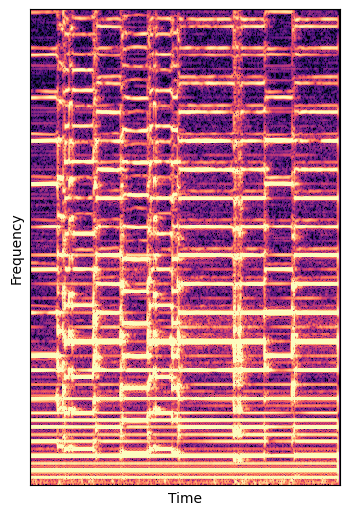

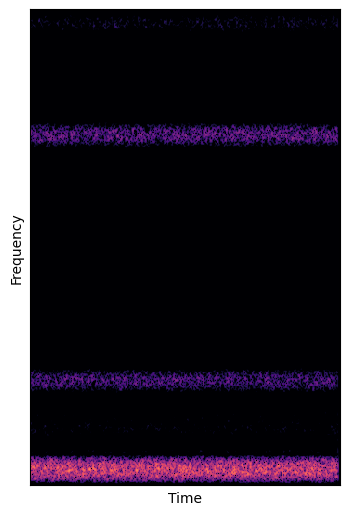

In [15]:
#RESYNTHESIS NO TOCAr ES ANTERIOR
from ddsp.colab.colab_utils_perso import play, specplot
import ddsp.training
import gin
from matplotlib import pyplot as plt
import numpy as np

data_provider = ddsp.training.data.TFRecordProvider(TRAIN_TFRECORD_FILEPATTERN)
dataset = data_provider.get_batch(batch_size=1, shuffle=False)

try:
  batch = next(iter(dataset))
except OutOfRangeError:
  raise ValueError(
      'TFRecord contains no examples. Please try re-running the pipeline with '
      'different audio file(s).')

# Parse the gin config.
gin_file = os.path.join(SAVE_DIR, 'operative_config-0.gin')
gin.parse_config_file(gin_file)

# Load model
model = ddsp.training.models.Autoencoder()
model.restore(SAVE_DIR)

# Resynthesize audio.
outputs = model(batch, training=False)
audio_gen = model.get_audio_from_outputs(outputs)
audio = batch['audio']

print('Original Audio')
specplot(audio)
play(audio)

print('Resynthesis')
specplot(audio_gen)
play(audio_gen)

C:\Users\Jesús Pavón García\AppData\Local\Programs\Python\Python310\lib\site-packages\librosa\core\convert.py:1869: RuntimeWarning: divide by zero encountered in log10
  + 2 * np.log10(f_sq)


Original Audio


Resynthesis


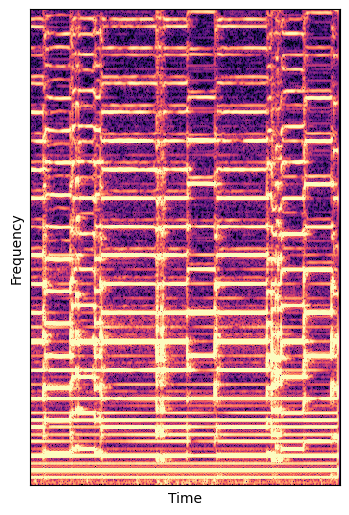

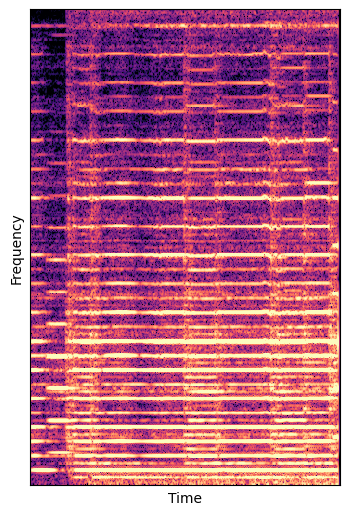

In [6]:
#RESYNTHESIS NO TOCAR 2n experimento
from ddsp.colab.colab_utils_perso import play, specplot
import ddsp.training
import gin
from matplotlib import pyplot as plt
import numpy as np

data_provider = ddsp.training.data.TFRecordProvider(TRAIN_TFRECORD_FILEPATTERN)
dataset = data_provider.get_batch(batch_size=1, shuffle=False)

try:
  batch = next(iter(dataset))
except OutOfRangeError:
  raise ValueError(
      'TFRecord contains no examples. Please try re-running the pipeline with '
      'different audio file(s).')

# Parse the gin config.
gin_file = os.path.join(SAVE_DIR, 'operative_config-0.gin')
gin.parse_config_file(gin_file)

# Load model
model = ddsp.training.models.Autoencoder()
model.restore(SAVE_DIR)

# Resynthesize audio.
outputs = model(batch, training=False)
audio_gen = model.get_audio_from_outputs(outputs)
audio = batch['audio']

print('Original Audio')
specplot(audio)
play(audio)

print('Resynthesis')
specplot(audio_gen)
play(audio_gen)

Original Audio (index 110)


Resynthesis


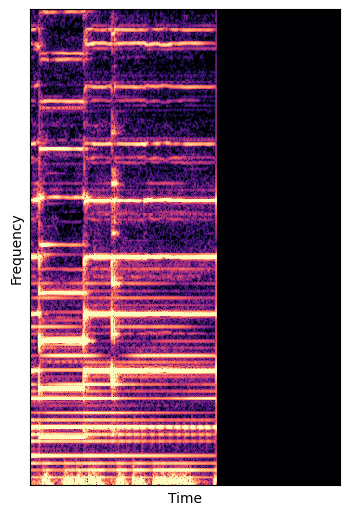

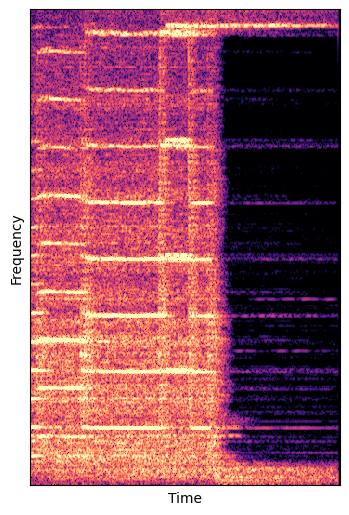

In [14]:
from ddsp.colab.colab_utils_perso import play, specplot
import ddsp.training, gin, os

# Parámetros
EXAMPLE_INDEX = 200  # Cambia esto para probar otro ejemplo

# Carga dataset
data_provider = ddsp.training.data.TFRecordProvider(TRAIN_TFRECORD_FILEPATTERN)
dataset = data_provider.get_batch(batch_size=1, shuffle=False)

# Escoger el batch por índice
batch = next(iter(dataset.skip(EXAMPLE_INDEX)))

# Carga modelo
gin.parse_config_file(os.path.join(SAVE_DIR, 'operative_config-0.gin'))
model = ddsp.training.models.Autoencoder()
model.restore(SAVE_DIR)

# Resintetiza
outputs = model(batch, training=False)
audio_gen = model.get_audio_from_outputs(outputs)
audio = batch['audio']

# Reproduce
print(f'Original Audio (index {EXAMPLE_INDEX})')
specplot(audio)
play(audio)

print('Resynthesis')
specplot(audio_gen)
play(audio_gen)


Original Audio (index 2)


Resynthesis


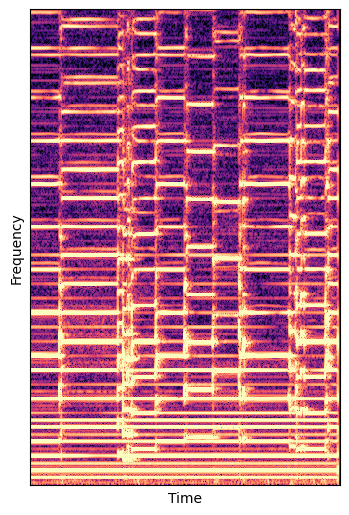

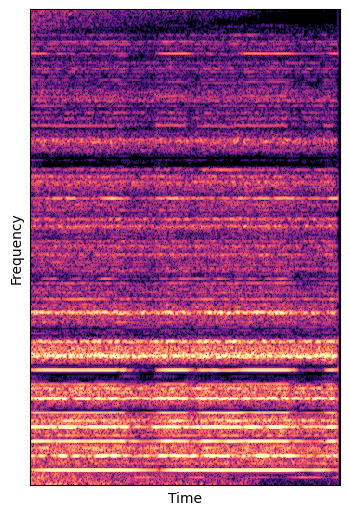

In [28]:
# Variables de ruta
TRAIN_TFRECORD = r'C:/Users/Jesús Pavón García/Desktop/TFG/DDSP_tfg/content/models/ddsp-solo-instrument/TFRECORD/train.tfrecord'
TRAIN_TFRECORD_FILEPATTERN = TRAIN_TFRECORD + '*'
SAVE_DIR = r'C:/Users/Jesús Pavón García/Desktop/TFG/DDSP_tfg/content/models/ddsp-solo-instrument/TRAIN_CHECK'

from ddsp.colab.colab_utils_perso import play, specplot
import ddsp.training, gin, os

# Parámetros
EXAMPLE_INDEX = 2  # Cambia esto para probar otro ejemplo

# Carga dataset
data_provider = ddsp.training.data.TFRecordProvider(TRAIN_TFRECORD_FILEPATTERN)
dataset = data_provider.get_batch(batch_size=1, shuffle=False)

# Escoger el batch por índice
batch = next(iter(dataset.skip(EXAMPLE_INDEX)))

# Carga modelo
gin.parse_config_file(os.path.join(SAVE_DIR, 'operative_config-0.gin'))
model = ddsp.training.models.Autoencoder()
model.restore(SAVE_DIR)

# Resintetiza
outputs = model(batch, training=False)
audio_gen = model.get_audio_from_outputs(outputs)
audio = batch['audio']

# Reproduce
print(f'Original Audio (index {EXAMPLE_INDEX})')
specplot(audio)
play(audio)

print('Resynthesis')
specplot(audio_gen)
play(audio_gen)

Original Audio (index 38)


Resynthesis


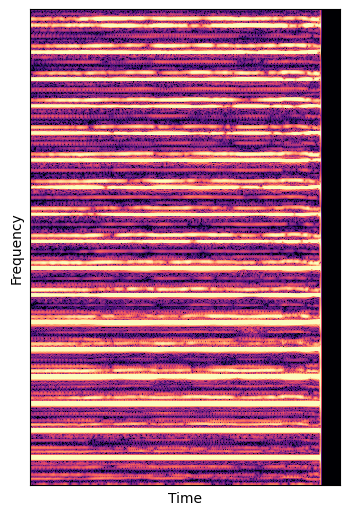

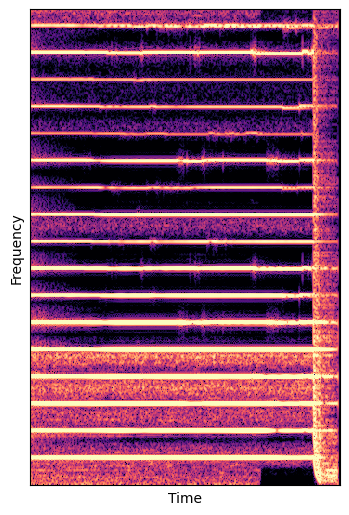

In [20]:
# Variables de ruta #DATASET DEF
TRAIN_TFRECORD = r'C:/Users/Jesús Pavón García/Desktop/TFG/DDSP_tfg/content/models/ddsp-solo-instrument/TFRECORD/train.tfrecord'
TRAIN_TFRECORD_FILEPATTERN = TRAIN_TFRECORD + '*'
SAVE_DIR = r'C:/Users/Jesús Pavón García/Desktop/TFG/DDSP_tfg/content/models/ddsp-solo-instrument/TRAIN_CHECK'

from ddsp.colab.colab_utils_perso import play, specplot
import ddsp.training, gin, os

# Parámetros
EXAMPLE_INDEX = 38  # Cambia esto para probar otro ejemplo

# Carga dataset
data_provider = ddsp.training.data.TFRecordProvider(TRAIN_TFRECORD_FILEPATTERN)
dataset = data_provider.get_batch(batch_size=1, shuffle=False)

# Escoger el batch por índice
batch = next(iter(dataset.skip(EXAMPLE_INDEX)))

# Carga modelo
gin.parse_config_file(os.path.join(SAVE_DIR, 'operative_config-0.gin'))
model = ddsp.training.models.Autoencoder()
model.restore(SAVE_DIR)

# Resintetiza
outputs = model(batch, training=False)
audio_gen = model.get_audio_from_outputs(outputs)
audio = batch['audio']

# Reproduce
print(f'Original Audio (index {EXAMPLE_INDEX})')
specplot(audio)
play(audio)

print('Resynthesis')
specplot(audio_gen)
play(audio_gen)

In [25]:
#EVALUATION

import glob
import os
import subprocess

# Variables de ruta
EVAL_TFRECORD = r'C:/Users/Jesús Pavón García/Desktop/TFG/DDSP_tfg/content/models/ddsp-solo-instrument/TFRECORD/EVAL_TFRECORD_SAMPLE/gnote.tfrecord'
EVAL_TFRECORD_FILEPATTERN = EVAL_TFRECORD + '*'

AUDIO_DIR = 'C:/Users/Jesús Pavón García/Desktop/TFG/DDSP_tfg/DataSet/Bagpipes/test/g4' 
AUDIO_FILEPATTERN = AUDIO_DIR + '/*'

# Verifica si hay archivos de audio
if not glob.glob(AUDIO_FILEPATTERN):
    raise ValueError('No se encontraron archivos de audio en ' + AUDIO_FILEPATTERN)

# Asegúrate de que la carpeta de salida existe
output_dir = os.path.dirname(EVAL_TFRECORD)
os.makedirs(output_dir, exist_ok=True)


# Ejecuta el comando para preparar el tfrecord
cmd = [
    "ddsp_prepare_tfrecord",
    f"--input_audio_filepatterns={AUDIO_FILEPATTERN}",
    f"--output_tfrecord_path={EVAL_TFRECORD}",
    "--num_shards=10",
    "--alsologtostderr"
]

print("Ejecutando ddsp_prepare_tfrecord...")
subprocess.run(cmd, shell=True)

Ejecutando ddsp_prepare_tfrecord...


CompletedProcess(args=['ddsp_prepare_tfrecord', '--input_audio_filepatterns=C:/Users/Jesús Pavón García/Desktop/TFG/DDSP_tfg/DataSet/Bagpipes/test/g4/*', '--output_tfrecord_path=C:/Users/Jesús Pavón García/Desktop/TFG/DDSP_tfg/content/models/ddsp-solo-instrument/TFRECORD/EVAL_TFRECORD_SAMPLE/gnote.tfrecord', '--num_shards=10', '--alsologtostderr'], returncode=0)

In [6]:
import subprocess

# Variables de ruta
SAVE_DIR = r'C:/Users/Jesús Pavón García/Desktop/TFG/DDSP_tfg/content/models/ddsp-solo-instrument/EVAL_CHECK'
RESTORE_DIR = r'C:/Users/Jesús Pavón García/Desktop/TFG/DDSP_tfg/content/models/ddsp-solo-instrument/TRAIN_CHECK'

# Variables de ruta
EVAL_TFRECORD = r'C:/Users/Jesús Pavón García/Desktop/TFG/DDSP_tfg/content/models/ddsp-solo-instrument/TFRECORD/EVAL_TFRECORD/eval.tfrecord'
EVAL_TFRECORD_FILEPATTERN = EVAL_TFRECORD + '*'

#GENERA TFRECORD TEST i carga sobre el checkpoint del model
cmd = [
    "ddsp_run" ,
      "--mode=eval" ,
      f"--restore_dir={RESTORE_DIR}",
      f"--save_dir={SAVE_DIR}",
      "--gin_file=models/solo_instrument.gin",
      "--gin_file=datasets/tfrecord.gin",
      f"--gin_param=TFRecordProvider.file_pattern='{EVAL_TFRECORD_FILEPATTERN}'",
      "--gin_file=eval/basic_f0_ld.gin",
      "--run_once=True",
      "--alsologtostderr",

]

# Ejecutar el comando
subprocess.run(cmd)

CompletedProcess(args=['ddsp_run', '--mode=eval', '--restore_dir=C:/Users/Jesús Pavón García/Desktop/TFG/DDSP_tfg/content/models/ddsp-solo-instrument/TRAIN_CHECK', '--save_dir=C:/Users/Jesús Pavón García/Desktop/TFG/DDSP_tfg/content/models/ddsp-solo-instrument/EVAL_CHECK', '--gin_file=models/solo_instrument.gin', '--gin_file=datasets/tfrecord.gin', "--gin_param=TFRecordProvider.file_pattern='C:/Users/Jesús Pavón García/Desktop/TFG/DDSP_tfg/content/models/ddsp-solo-instrument/TFRECORD/EVAL_TFRECORD/eval.tfrecord*'", '--gin_file=eval/basic_f0_ld.gin', '--run_once=True', '--alsologtostderr'], returncode=0)

In [ ]:
import subprocess

# Variables de ruta
SAVE_DIR = r'C:/Users/Jesús Pavón García/Desktop/TFG/DDSP_tfg/content/models/ddsp-solo-instrument/RESYNTH'
RESTORE_DIR = r'C:/Users/Jesús Pavón García/Desktop/TFG/DDSP_tfg/content/models/ddsp-solo-instrument/TRAIN_CHECK'

# Variables de ruta
EVAL_TFRECORD = r'C:/Users/Jesús Pavón García/Desktop/TFG/DDSP_tfg/content/models/ddsp-solo-instrument/TFRECORD/EVAL_TFRECORD/eval.tfrecord'
EVAL_TFRECORD_FILEPATTERN = EVAL_TFRECORD + '*'

#GENERA TFRECORD TEST i carga sobre el checkpoint del model
cmd = [
    "ddsp_run" ,
      "--mode=sample" ,
      f"--restore_dir={RESTORE_DIR}",
      f"--save_dir={SAVE_DIR}",
      "--gin_file=models/solo_instrument.gin",
      "--gin_file=datasets/tfrecord.gin",
      f"--gin_param=TFRecordProvider.file_pattern='{EVAL_TFRECORD_FILEPATTERN}'",
      "--gin_file=eval/basic_f0_ld.gin",
      "--alsologtostderr",

]

# Ejecutar el comando
subprocess.run(cmd)

Original Audio (index 2)


Resynthesis


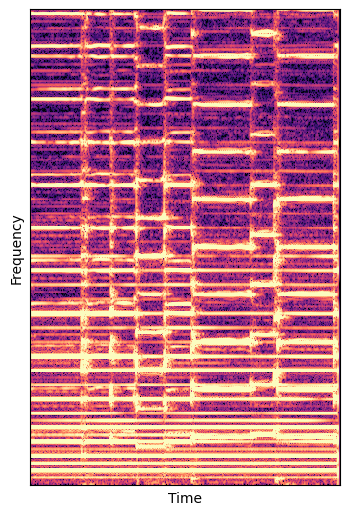

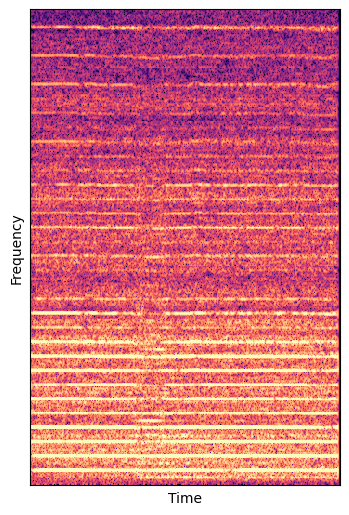

In [72]:
# Variables de ruta 1

"""
#TEST AUDIO copy/paste
fairy/TFRECORD/fairy.tfrecord 
g4/TFRECORD/gnote.tfrecord
barquin/TFRECORD/barquin.tfrecord
"""

"""
#MODELS copy/paste
#A ddsp-solo-instrument-34 files-3k-steps - 10 min - 1 source - no equilibrat/TRAIN_CHECK #A
#B ddsp-solo-instrument -438files-3ksteps - 30 min - 5 source - equilibrat/TRAIN_CHECK
#C ddsp-solo-instrument - 564files - 3ksteps - 40min - 5 source - no equilibrat/TRAIN_CHECK
#D ddsp-solo-instrument - 75 files  - 300 steps - 17 min - 5 source - equilibrat/TRAIN_CHECK
#E ddsp-solo-instrument - 75 files  - 3k steps - 17 min - 5 source - equilibrat/TRAIN_CHECK

"""
EVAL_TFRECORD = r'C:/Users/Jesús Pavón García/Desktop/TFG/DDSP_tfg/DataSet/Bagpipes/test/fairy/TFRECORD/fairy.tfrecord'
EVAL_TFRECORD_FILEPATTERN = EVAL_TFRECORD + '*'
SAVE_DIR = r'C:/Users/Jesús Pavón García/Desktop/TFG/DDSP_tfg/content/models/ddsp-solo-instrument -438files-3ksteps - 30 min - 5 source - equilibrat/TRAIN_CHECK'

from ddsp.colab.colab_utils_perso import play, specplot
import ddsp.training, gin, os

# Parámetros
EXAMPLE_INDEX = 2  # Cambia esto para probar otro ejemplo

# Carga dataset
data_provider = ddsp.training.data.TFRecordProvider(EVAL_TFRECORD_FILEPATTERN)
dataset = data_provider.get_batch(batch_size=1, shuffle=False)

# Escoger el batch por índice
batch = next(iter(dataset.skip(EXAMPLE_INDEX)))

# Carga modelo
gin.parse_config_file(os.path.join(SAVE_DIR, 'operative_config-0.gin'))
model = ddsp.training.models.Autoencoder()
model.restore(SAVE_DIR)

# Resintetiza
outputs = model(batch, training=False)
audio_gen = model.get_audio_from_outputs(outputs)
audio = batch['audio']

# Reproduce
print(f'Original Audio (index {EXAMPLE_INDEX})')
specplot(audio)
play(audio)

print('Resynthesis')
specplot(audio_gen)
play(audio_gen)

Original Audio (index 2)


Resynthesis


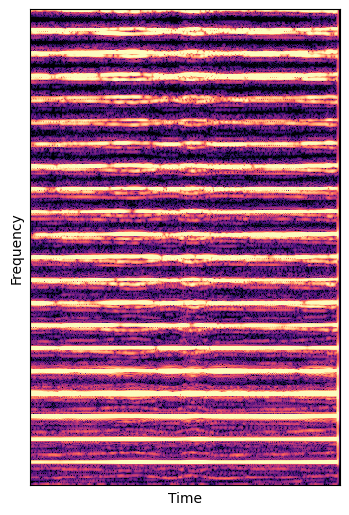

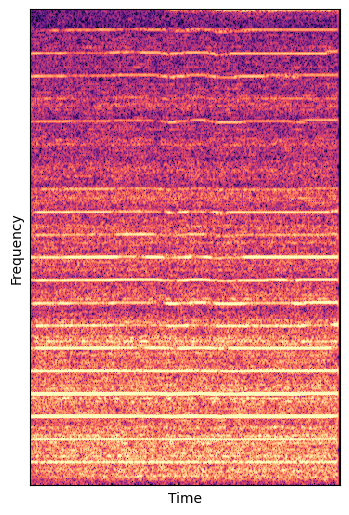

In [71]:
# Variables de ruta 2

"""
#TEST AUDIO copy/paste
fairy/TFRECORD/fairy.tfrecord 
g4/TFRECORD/gnote.tfrecord
barquin/TFRECORD/barquin.tfrecord
"""

"""
#MODELS copy/paste
ddsp-solo-instrument-34 files-3k-steps - 10 min - 1 source - no equilibrat/TRAIN_CHECK
ddsp-solo-instrument -438files-3ksteps - 30 min - 5 source - equilibrat/TRAIN_CHECK
ddsp-solo-instrument - 564files - 3ksteps - 40min - 5 source - no equilibrat/TRAIN_CHECK
ddsp-solo-instrument - 75 files  - 300 steps - 17 min - 5 source - equilibrat/TRAIN_CHECK
ddsp-solo-instrument - 75 files  - 3k steps - 17 min - 5 source - equilibrat/TRAIN_CHECK

"""
EVAL_TFRECORD = r'C:/Users/Jesús Pavón García/Desktop/TFG/DDSP_tfg/DataSet/Bagpipes/test/g4/TFRECORD/gnote.tfrecord'
EVAL_TFRECORD_FILEPATTERN = EVAL_TFRECORD + '*'
SAVE_DIR = r'C:/Users/Jesús Pavón García/Desktop/TFG/DDSP_tfg/content/models/ddsp-solo-instrument -438files-3ksteps - 30 min - 5 source - equilibrat/TRAIN_CHECK'

from ddsp.colab.colab_utils_perso import play, specplot
import ddsp.training, gin, os

# Parámetros
EXAMPLE_INDEX = 2  # Cambia esto para probar otro ejemplo

# Carga dataset
data_provider = ddsp.training.data.TFRecordProvider(EVAL_TFRECORD_FILEPATTERN)
dataset = data_provider.get_batch(batch_size=1, shuffle=False)

# Escoger el batch por índice
batch = next(iter(dataset.skip(EXAMPLE_INDEX)))

# Carga modelo
gin.parse_config_file(os.path.join(SAVE_DIR, 'operative_config-0.gin'))
model = ddsp.training.models.Autoencoder()
model.restore(SAVE_DIR)

# Resintetiza
outputs = model(batch, training=False)
audio_gen = model.get_audio_from_outputs(outputs)
audio = batch['audio']

# Reproduce
print(f'Original Audio (index {EXAMPLE_INDEX})')
specplot(audio)
play(audio)

print('Resynthesis')
specplot(audio_gen)
play(audio_gen)

Original Audio (index 2)


Resynthesis


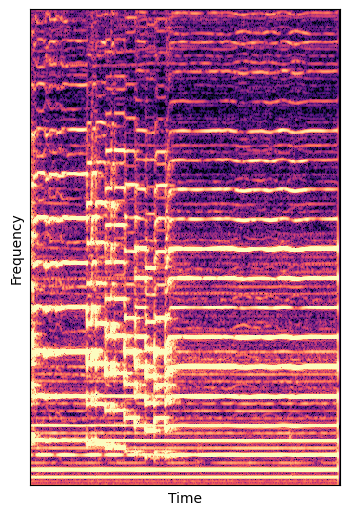

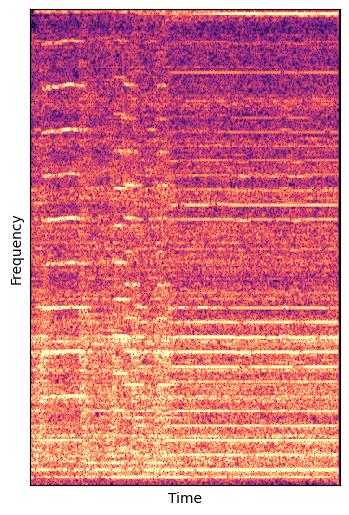

In [70]:
# Variables de ruta 3

"""
#TEST AUDIO copy/paste
fairy/TFRECORD/fairy.tfrecord 
g4/TFRECORD/gnote.tfrecord
barquin/TFRECORD/barquin.tfrecord
"""

"""
#MODELS copy/paste
ddsp-solo-instrument-34 files-3k-steps - 10 min - 1 source - no equilibrat/TRAIN_CHECK
ddsp-solo-instrument -438files-3ksteps - 30 min - 5 source - equilibrat/TRAIN_CHECK
ddsp-solo-instrument - 564files - 3ksteps - 40min - 5 source - no equilibrat/TRAIN_CHECK
ddsp-solo-instrument - 75 files  - 300 steps - 17 min - 5 source - equilibrat/TRAIN_CHECK
ddsp-solo-instrument - 75 files  - 3k steps - 17 min - 5 source - equilibrat/TRAIN_CHECK

"""
EVAL_TFRECORD = r'C:/Users/Jesús Pavón García/Desktop/TFG/DDSP_tfg/DataSet/Bagpipes/test/barquin/TFRECORD/barquin.tfrecord'
EVAL_TFRECORD_FILEPATTERN = EVAL_TFRECORD + '*'
SAVE_DIR = r'C:/Users/Jesús Pavón García/Desktop/TFG/DDSP_tfg/content/models/ddsp-solo-instrument -438files-3ksteps - 30 min - 5 source - equilibrat/TRAIN_CHECK'

from ddsp.colab.colab_utils_perso import play, specplot
import ddsp.training, gin, os

# Parámetros
EXAMPLE_INDEX = 2  # Cambia esto para probar otro ejemplo

# Carga dataset
data_provider = ddsp.training.data.TFRecordProvider(EVAL_TFRECORD_FILEPATTERN)
dataset = data_provider.get_batch(batch_size=1, shuffle=False)

# Escoger el batch por índice
batch = next(iter(dataset.skip(EXAMPLE_INDEX)))

# Carga modelo
gin.parse_config_file(os.path.join(SAVE_DIR, 'operative_config-0.gin'))
model = ddsp.training.models.Autoencoder()
model.restore(SAVE_DIR)

# Resintetiza
outputs = model(batch, training=False)
audio_gen = model.get_audio_from_outputs(outputs)
audio = batch['audio']

# Reproduce
print(f'Original Audio (index {EXAMPLE_INDEX})')
specplot(audio)
play(audio)

print('Resynthesis')
specplot(audio_gen)
play(audio_gen)

In [28]:
import os
import subprocess
import shutil
import zipfile

def export_model_local(model_dir, model_name="Name"):
    export_path = os.path.join(model_dir, model_name)

    # Ejecutar el comando ddsp_export con subprocess
    command = [
        "ddsp_export",
        f"--name={model_name}",
        f"--model_path={model_dir}",
        f"--save_dir={export_path}",
        "--inference_model=vst_stateless_predict_controls",
        "--tflite",
        "--notfjs"
    ]
    
    print("Exportando modelo...")
    subprocess.run(command, check=True)
    print("¡Exportación completa!")

    # Crear el archivo zip
    zip_fname = f"{model_name}.zip"
    zip_fp = os.path.join(model_dir, zip_fname)

    print(f"Comprimiendo {export_path} a {zip_fp}...")
    with zipfile.ZipFile(zip_fp, 'w', zipfile.ZIP_DEFLATED) as zipf:
        for root, _, files in os.walk(export_path):
            for file in files:
                filepath = os.path.join(root, file)
                arcname = os.path.relpath(filepath, model_dir)
                zipf.write(filepath, arcname)

    print(f"¡Compresión completa! Archivo guardado en: {zip_fp}")
    print(f"También puedes encontrar tu modelo en: {export_path}")


In [29]:
SAVE_DIR = r'C:/Users/Jesús Pavón García/Desktop/TFG/DDSP_tfg/content/models/ddsp-solo-instrument - 75 files  - 3k steps - 17 min - 5 source - equilibrat/TRAIN_CHECK'
export_model_local(SAVE_DIR, model_name= 'Model E')

Exportando modelo...


CalledProcessError: Command '['ddsp_export', '--name=Model E', '--model_path=C:/Users/Jesús Pavón García/Desktop/TFG/DDSP_tfg/content/models/ddsp-solo-instrument - 75 files  - 3k steps - 17 min - 5 source - equilibrat/TRAIN_CHECK', '--save_dir=C:/Users/Jesús Pavón García/Desktop/TFG/DDSP_tfg/content/models/ddsp-solo-instrument - 75 files  - 3k steps - 17 min - 5 source - equilibrat/TRAIN_CHECK\\Model E', '--inference_model=vst_stateless_predict_controls', '--tflite', '--notfjs']' returned non-zero exit status 1.